# SDDP and newsvendor

## Classic SDDP

In [35]:
using Distributions, JuMP, Gurobi, Plots, ProgressMeter
gurobi_env = Gurobi.Env()

Academic license - for non-commercial use only


Gurobi.Env(Ptr{Nothing} @0x0000000005f0a690)

In [36]:
p = 1.0 #day ahead price
q = 2.0 #same day price

#array de vectores de cuts. Arranca en la lower bound
cuts = [[0.0;0.0]];

#condicion inicial de stock
x0=0.0;

In [37]:
@showprogress for i=1:40
    #resuelvo el primer paso
    model = JuMP.Model(optimizer_with_attributes(() -> Gurobi.Optimizer(gurobi_env), "OutputFlag" => 0))
#    set_optimizer_attributes(model, "OutputFlag"=>0)
    @variable(model,reserve>=0);
    @variable(model,stock>=0);
    @variable(model,z);

    for i=1:length(cuts)
        cut=cuts[i]
        @constraint(model,z>=cut[1]+cut[2]*(stock+reserve));
    end

    fix_x = @constraint(model,stock==x0);

    @objective(model,Min,p*reserve+z);

    optimize!(model)

    x=value(stock)+value(reserve);

#demand=rand(DiscreteUniform(0,100));
    #resuelvo para todos los ruidos el segundo paso y agrego un corte
    local_cuts = [];

    for demand=1:100


        model = JuMP.Model(optimizer_with_attributes(() -> Gurobi.Optimizer(gurobi_env), "OutputFlag" => 0))

        @variable(model,shortage>=0);
        @variable(model,stock>=0);

        fix_x = @constraint(model,x-demand+shortage>=0);

#        fix_x = @constraint(model,stock==x);

        @objective(model,Min,q*shortage);

        optimize!(model)

        beta = objective_value(model);
        lambda = -dual(fix_x)

        push!(local_cuts,[beta-lambda*x;lambda])

    end

    new_cut = 1/100*[sum([c[1] for c in local_cuts]);sum([c[2] for c in local_cuts])];
    push!(cuts,new_cut);
end

Progress: 100%|█████████████████████████████████████████| Time: 0:00:02


### Animación de los cortes

┌ Info: Saved animation to 
│   fn = /home/andres/workspace/julia/sddp/newsvendor/tmp.gif
└ @ Plots /home/andres/.julia/packages/Plots/ViMfq/src/animation.jl:104


Plots.AnimatedGif("/home/andres/workspace/julia/sddp/newsvendor/tmp.gif")
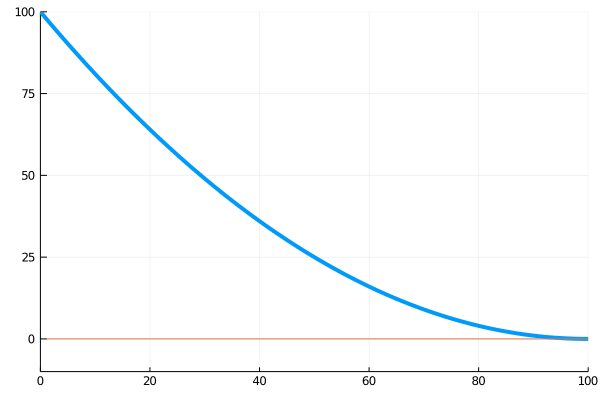

In [38]:
#Ploteo los cuts obtenidos
x=(0:100)
pl=plot(;legend=:none,xlim=(0,100),ylim=(-10,100))
plot!(pl,x,(100 .-x).^2/100,lw=4)


anim = @animate for i=1:length(cuts)
    cut=cuts[i]
    plot!(pl,cut[1].+cut[2]*x);
end

gif(anim,"tmp.gif",fps=1)

### Resuelvo el problema de stock

In [39]:
#resuelvo una vez mas para hallar el costo optimo
model = JuMP.Model(optimizer_with_attributes(() -> Gurobi.Optimizer(gurobi_env)))


@variable(model,reserve>=0);
@variable(model,stock>=0);
@variable(model,z);

for i=1:length(cuts)
    cut=cuts[i]
    @constraint(model,z>=cut[1]+cut[2]*(stock+reserve));
end

fix_x = @constraint(model,stock==x0);

@objective(model,Min,p*reserve+z);

optimize!(model)

x=value(stock)+value(reserve);
costo = objective_value(model);



Optimize a model with 42 rows, 3 columns and 122 nonzeros
Coefficient statistics:
  Matrix range     [5e-01, 2e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e+01, 1e+02]
Presolve removed 1 rows and 35 columns
Presolve time: 0.00s
Presolved: 2 rows, 7 columns, 14 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -0.0000000e+00   0.000000e+00   4.983800e+02      0s
       7    7.5500000e+01   0.000000e+00   0.000000e+00      0s

Solved in 7 iterations and 0.00 seconds
Optimal objective  7.550000000e+01


## Stochastic cutting plane

In [40]:
#array de vectores de cuts. Arranca en la lower bound
cuts = [[0.0;0.0]];

#aca guardo solo los multiplicadores
duals = [0.0];

#aca guardo los ruidos que fueron saliendo
noises = Array{Float64}(undef,0);

#condicion inicial de stock
x0=0.0;

In [49]:
@showprogress 1 "Computing..." for l=1:200
    #resuelvo el primer paso
    model = JuMP.Model(optimizer_with_attributes(() -> Gurobi.Optimizer(gurobi_env), "OutputFlag" => 0))

    @variable(model,reserve>=0);
    @variable(model,stock>=0);
    @variable(model,z);

    for k=1:length(cuts)
        cut=cuts[k]
        @constraint(model,z>=cut[1]+cut[2]*(stock+reserve));
    end

    fix_x = @constraint(model,stock==x0);

    @objective(model,Min,p*reserve+z);

    optimize!(model)

    x=value(stock)+value(reserve);

    #resuelvo para un ruido en el segundo paso y agrego un corte
    demand=rand(DiscreteUniform(1,100));

    push!(noises,demand)

    local_cuts = [];

    for k=1:length(noises)

        model = JuMP.Model(optimizer_with_attributes(() -> Gurobi.Optimizer(gurobi_env), "OutputFlag" => 0))

        @variable(model,shortage>=0);
        @variable(model,stock>=0);

        fix_x = @constraint(model,x-noises[k]+shortage>=0);

    #    fix_x = @constraint(model,stock==x);

        @objective(model,Min,q*shortage);

        optimize!(model)

        beta = objective_value(model);
        lambda = -dual(fix_x)

        push!(local_cuts,[beta-lambda*x;lambda])

    end


    #update all previous cuts for averaging
    for j=1:length(cuts)
        cuts[j] = (l-1)/l * cuts[j];
    end

    new_cut = 1/length(local_cuts)*[sum([c[1] for c in local_cuts]);sum([c[2] for c in local_cuts])];
    push!(cuts,new_cut);
    push!(duals,new_cut[2]);

end

Computing...100%|███████████████████████████████████████| Time: 0:01:28


### Animación de los cortes

┌ Info: Saved animation to 
│   fn = /home/andres/workspace/julia/sddp/newsvendor/tmp2.gif
└ @ Plots /home/andres/.julia/packages/Plots/ViMfq/src/animation.jl:104


Plots.AnimatedGif("/home/andres/workspace/julia/sddp/newsvendor/tmp2.gif")
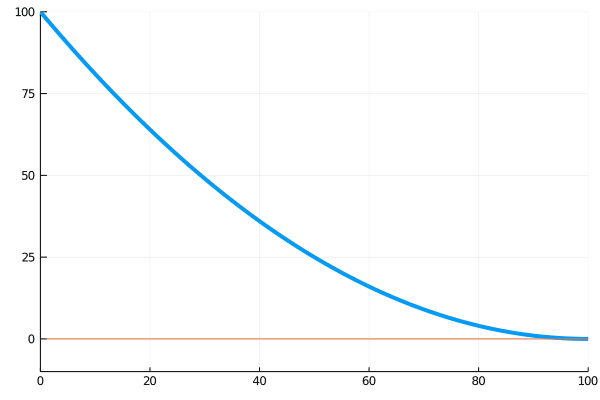

In [46]:
#Ploteo los cuts obtenidos
x=(0:100)
pl=plot(;legend=:none,xlim=(0,100),ylim=(-10,100))
plot!(pl,x,(100 .-x).^2/100,lw=4)


anim = @animate for i=1:length(cuts)
    cut=cuts[i]
    plot!(pl,cut[1].+cut[2]*x);
end

gif(anim,"tmp2.gif",fps=10)

### Resuelvo el problema de stock

In [47]:
#resuelvo una vez mas para hallar el costo optimo
model = JuMP.Model(optimizer_with_attributes(() -> Gurobi.Optimizer(gurobi_env)))

@variable(model,reserve>=0);
@variable(model,stock>=0);
@variable(model,z);

for i=1:length(cuts)
    cut=cuts[i]
    @constraint(model,z>=cut[1]+cut[2]*(stock+reserve));
end

fix_x = @constraint(model,stock==x0);

@objective(model,Min,p*reserve+z);

optimize!(model)

x=value(stock)+value(reserve);
costo = objective_value(model);

Academic license - for non-commercial use only
Academic license - for non-commercial use only
Optimize a model with 670 rows, 3 columns and 1670 nonzeros
Coefficient statistics:
  Matrix range     [2e-03, 1e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e-01, 8e+01]
Presolve removed 1 rows and 170 columns
Presolve time: 0.00s
Presolved: 2 rows, 500 columns, 1000 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -0.0000000e+00   0.000000e+00   1.954291e+04      0s
      12    7.7310989e+01   0.000000e+00   0.000000e+00      0s

Solved in 12 iterations and 0.00 seconds
Optimal objective  7.731098863e+01


## Stochastic Decomposition

In [51]:
#array de vectores de cuts. Arranca en la lower bound
cuts = [[0.0;0.0]];

#aca guardo solo los multiplicadores
duals = Set{Float64}();

#aca guardo los ruidos que fueron saliendo
noises = Array{Float64}(undef,0);

#condicion inicial de stock
x0=0.0;

In [56]:
@showprogress 1 "Computing..." for l=1:500

    #resuelvo el primer paso
    model = JuMP.Model(optimizer_with_attributes(() -> Gurobi.Optimizer(gurobi_env), "OutputFlag" => 0))

    @variable(model,reserve>=0);
    @variable(model,stock>=0);
    @variable(model,z);

    cut_constraints = [];
    for k=1:length(cuts)
        cut=cuts[k]
        c=@constraint(model,z>=cut[1]+cut[2]*(stock+reserve));
        push!(cut_constraints,c);
    end

    fix_x = @constraint(model,stock==x0);

    @objective(model,Min,p*reserve+z);

    optimize!(model)

    #purge cuts!
    #multipliers = [dual(c) for c in cut_constraints];
    #idx = filter(k->multipliers[k]!=0,(1:length(cuts)));
    #cuts = cuts[idx];


    x=value(stock)+value(reserve);

    #resuelvo para un ruido en el segundo paso y agrego un corte
    demand=rand(DiscreteUniform(0,100));
    push!(noises,demand)


    model = JuMP.Model(optimizer_with_attributes(() -> Gurobi.Optimizer(gurobi_env), "OutputFlag" => 0))

    @variable(model,shortage>=0);
    @variable(model,stock>=0);

    fix_x = @constraint(model,x-demand+shortage>=0);

#    fix_x = @constraint(model,stock==x);

    @objective(model,Min,q*shortage);

    optimize!(model)

    beta = objective_value(model);
    #cambio el signo del multiplicador por que es >= en la constraint
    lambda = dual(fix_x)

    push!(duals,lambda)

    #update all previous cuts for averaging
    for j=1:length(cuts)
        cuts[j] = (l-1)/l * cuts[j];
    end

    pik = similar(noises);
    #genero el new cut recorriendo todos los ruidos
    for j=1:length(noises)
        aux = [(pi*(noises[j]-x),pi) for pi in duals]
        _, ix = findmax([a[1] for a in aux])
        pik[j] = aux[ix][2];
    end

    new_cut  = 1/l * [ sum(pik.*noises); -sum(pik) ];

    push!(cuts,new_cut);

end

Computing...100%|███████████████████████████████████████| Time: 0:00:07


### Animacion de los cortes

┌ Info: Saved animation to 
│   fn = /home/andres/workspace/julia/sddp/newsvendor/tmp3.gif
└ @ Plots /home/andres/.julia/packages/Plots/ViMfq/src/animation.jl:104


Plots.AnimatedGif("/home/andres/workspace/julia/sddp/newsvendor/tmp3.gif")
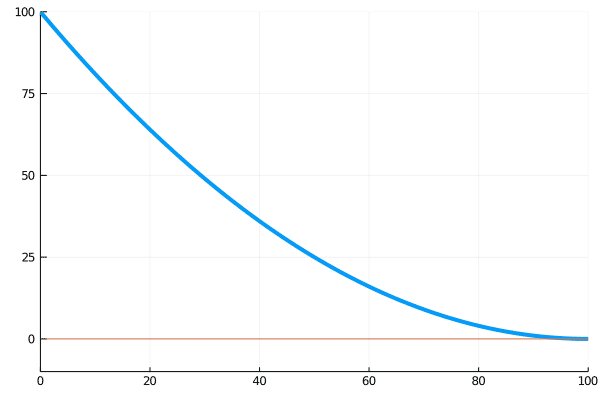

In [57]:
#Ploteo los cuts obtenidos
x=(0:100)
pl=plot(;legend=:none,xlim=(0,100),ylim=(-10,100))
plot!(pl,x,(100 .-x).^2/100,lw=4)


anim = @animate for i=1:length(cuts)
    cut=cuts[i]
    plot!(pl,cut[1].+cut[2]*x);
end

gif(anim,"tmp3.gif",fps=10)

### Resuelvo el problema de stock.

In [58]:
#resuelvo una vez mas para hallar el costo optimo
model = JuMP.Model(optimizer_with_attributes(() -> Gurobi.Optimizer(gurobi_env)))

@variable(model,reserve>=0);
@variable(model,stock>=0);
@variable(model,z);

for i=1:length(cuts)
    cut=cuts[i]
    @constraint(model,z>=cut[1]+cut[2]*(stock+reserve));
end

fix_x = @constraint(model,stock==x0);

@objective(model,Min,p*reserve+z);

optimize!(model)

x=value(stock)+value(reserve);
costo = objective_value(model);

Optimize a model with 902 rows, 3 columns and 1902 nonzeros
Coefficient statistics:
  Matrix range     [2e-02, 1e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e+00, 9e+01]
Presolve removed 1 rows and 713 columns
Presolve time: 0.00s
Presolved: 2 rows, 189 columns, 378 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0   -0.0000000e+00   0.000000e+00   9.020700e+03      0s
       6    8.6360000e+01   0.000000e+00   0.000000e+00      0s

Solved in 6 iterations and 0.00 seconds
Optimal objective  8.636000000e+01
